In [409]:
import os
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm


In [410]:
class ImageFolderDataset(Dataset):
    def __init__(self, image_folder, transform=None):
        self.image_folder = image_folder
        self.image_files = [f for f in os.listdir(image_folder) if f.endswith('.jpg')]
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_name = self.image_files[idx]
        image_path = os.path.join(self.image_folder, image_name)
        image = Image.open(image_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image_name, image


In [411]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])


In [412]:
vgg16 = models.vgg16(pretrained=True)
vgg16.classifier = torch.nn.Sequential(*list(vgg16.classifier.children())[:-1])  # Remove final layer
vgg16.eval()
vgg16.cuda()  # Use CUDA if available


c:\Users\Ashwin Kilingar\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Ashwin Kilingar\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [413]:
dataset = ImageFolderDataset("./output/images/Images", transform=transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)

features_dict = {}

with torch.no_grad():
    for image_names, images in tqdm(dataloader):
        images = images.cuda()
        features = vgg16(images)  # shape: (batch_size, 4096)
        for name, feat in zip(image_names, features):
            features_dict[name] = feat.cpu()


100%|██████████| 125/125 [00:32<00:00,  3.81it/s]


In [414]:
torch.save(features_dict, 'vgg16_image_features.pt')


In [415]:
import os
import re
import numpy as np
from collections import defaultdict
from tqdm import tqdm


In [416]:
def load_captions(captions_file):
    image_captions = defaultdict(list)
    with open(captions_file, 'r') as f:
        for line in f:
            img_id, caption = line.strip().split('\t')
            img_id = img_id.split('#')[0]
            caption = caption.lower()
            caption = re.sub(r'[^a-z0-9\s]', '', caption)  # remove punctuation
            image_captions[img_id].append(caption)
    return image_captions


In [417]:
def build_vocab(image_captions, min_freq=1):
    word_counts = defaultdict(int)
    for captions in image_captions.values():
        for caption in captions:
            for word in caption.split():
                word_counts[word] += 1

    # Filter words by min_freq
    vocab = [word for word, count in word_counts.items() if count >= min_freq]
    
    # Add special tokens
    vocab = ['<pad>', '<start>', '<end>', '<unk>'] + sorted(vocab)

    word2idx = {word: idx for idx, word in enumerate(vocab)}
    idx2word = {idx: word for word, idx in word2idx.items()}
    return vocab, word2idx, idx2word


In [418]:
def load_glove_embeddings(glove_file, word2idx, embedding_dim=200):
    embeddings = np.random.uniform(-0.05, 0.05, (len(word2idx), embedding_dim)).astype(np.float32)
    embeddings[word2idx['<pad>']] = np.zeros((embedding_dim,))  # pad vector is zeros
    
    with open(glove_file, 'r', encoding='utf-8') as f:
        for line in tqdm(f, desc="Loading GloVe"):
            values = line.strip().split()
            word = values[0]
            if word in word2idx:
                vector = np.asarray(values[1:], dtype=np.float32)
                embeddings[word2idx[word]] = vector

    return embeddings


In [419]:
captions_file = './output/captions.txt'
glove_file = 'glove.6B.200d.txt'

image_captions = load_captions(captions_file)
vocab, word2idx, idx2word = build_vocab(image_captions)
embedding_matrix = load_glove_embeddings(glove_file, word2idx)


Loading GloVe: 400000it [00:04, 98690.34it/s] 


In [420]:
from torch.nn.utils.rnn import pad_sequence
import torch

# Define special tokens
PAD_TOKEN = "<pad>"
UNK_TOKEN = "<unk>"
START_TOKEN = "<start>"
END_TOKEN = "<end>"

# Ensure these are in your vocab
special_tokens = [PAD_TOKEN, UNK_TOKEN, START_TOKEN, END_TOKEN]
for token in special_tokens:
    if token not in word2idx:
        word2idx[token] = len(word2idx)

pad_idx = word2idx[PAD_TOKEN]
start_idx = word2idx[START_TOKEN]
end_idx = word2idx[END_TOKEN]

# Sample padded caption preprocessing
def tokenize_and_pad(captions_tokenized, max_length):
    padded = []
    for tokens in captions_tokenized:
        tokens = [start_idx] + tokens + [end_idx]
        if len(tokens) < max_length:
            tokens += [pad_idx] * (max_length - len(tokens))
        else:
            tokens = tokens[:max_length]
        padded.append(torch.tensor(tokens, dtype=torch.long))
    return padded


In [421]:
def collate_fn(batch):
    images, captions = zip(*batch)
    captions = tokenize_and_pad(captions, max_length=MAX_LENGTH)
    captions = torch.stack(captions)
    images = torch.stack(images)
    return images, captions


In [422]:
np.save('glove_embeddings.npy', embedding_matrix)
import pickle
with open('vocab.pkl', 'wb') as f:
    pickle.dump({'word2idx': word2idx, 'idx2word': idx2word}, f)


In [423]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
import numpy as np
import random
from tqdm import tqdm


In [424]:
class CaptionDataset(Dataset):
    def __init__(self, features_dict, image_captions, word2idx, max_len=20):
        self.data = []
        self.word2idx = word2idx
        self.max_len = max_len
        self.features_dict = features_dict

        self.pad_idx = word2idx['<pad>']
        self.unk_idx = word2idx['<unk>']
        self.start_idx = word2idx['<start>']
        self.end_idx = word2idx['<end>']

        for img, captions in image_captions.items():
            if img not in features_dict:
                continue
            for cap in captions:
                # Tokenize and map to indices with fallback to <unk>
                tokens = [self.word2idx.get(w, self.unk_idx) for w in cap.split()]
                token_ids = [self.start_idx] + tokens + [self.end_idx]

                # Truncate and pad
                if len(token_ids) < max_len:
                    token_ids += [self.pad_idx] * (max_len - len(token_ids))
                else:
                    token_ids = token_ids[:max_len]

                self.data.append((img, torch.tensor(token_ids, dtype=torch.long)))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_name, caption = self.data[idx]
        features = self.features_dict[img_name]
        return features, caption, img_name


In [490]:
import torch
import torch.nn as nn

class RNNDecoder(nn.Module):
    def __init__(self, embedding_matrix, hidden_size, vocab_size,
                 embedding_dim=200, feature_dim=4096):
        super(RNNDecoder, self).__init__()
        self.hidden_size = hidden_size

        self.embed = nn.Embedding.from_pretrained(torch.tensor(embedding_matrix), freeze=False)

        # Project image features to match embedding space
        self.img_fc = nn.Linear(feature_dim, embedding_dim)
        # New: project image features to initial hidden state
        self.init_hidden = nn.Linear(feature_dim, hidden_size)

        self.relu = nn.ReLU()
        self.rnn = nn.RNN(embedding_dim, hidden_size, batch_first=True)
        self.fc_out = nn.Linear(hidden_size, vocab_size)

    def forward(self, image_features, captions):
        """
        Args:
            image_features: (B, 4096)
            captions: (B, T)
        """
        embeddings = self.embed(captions)  # (B, T, E)

        # Image feature for first token embedding
        img_emb = self.relu(self.img_fc(image_features)).unsqueeze(1)  # (B, 1, E)
        inputs = torch.cat((img_emb, embeddings[:, :-1]), dim=1)  # (B, T, E)

        # Learned hidden state from image features
        h0 = self.relu(self.init_hidden(image_features)).unsqueeze(0)  # (1, B, H)

        output, _ = self.rnn(inputs, h0)  # (B, T, H)
        logits = self.fc_out(output)      # (B, T, V)
        return logits


In [491]:
def train_model(model, dataloader, criterion, optimizer, device):
    model.train()
    total_loss = 0

    for features, captions,_ in tqdm(dataloader, desc="Training"):
        features, captions = features.to(device), captions.to(device)
        optimizer.zero_grad()
        outputs = model(features, captions)
        loss = criterion(outputs.view(-1, outputs.size(-1)), captions.view(-1))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    return total_loss / len(dataloader)


In [492]:
def evaluate_model(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for features, captions,_ in tqdm(dataloader, desc="Evaluating"):
            features, captions = features.to(device), captions.to(device)
            outputs = model(features, captions)
            loss = criterion(outputs.view(-1, outputs.size(-1)), captions.view(-1))
            total_loss += loss.item()
    return total_loss / len(dataloader)


In [520]:
# Load data
features_dict = torch.load('vgg16_image_features.pt')
image_captions = load_captions('./output/captions.txt')  # from earlier
vocab, word2idx, idx2word = build_vocab(image_captions)
embedding_matrix = np.load('glove_embeddings.npy')

# Dataset & split
dataset = CaptionDataset(features_dict, image_captions, word2idx)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_ds, val_ds = random_split(dataset, [train_size, val_size])
train_loader = DataLoader(train_ds, batch_size=64, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=64)

# Model, loss, optimizer
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RNNDecoder(embedding_matrix, hidden_size=50, vocab_size=len(vocab)).to(device)
criterion = nn.CrossEntropyLoss(ignore_index=word2idx['<pad>'])
optimizer = optim.Adam(model.parameters(), lr=5e-4)

train_losses = []
val_losses = []

for epoch in range(35):
    
    train_loss = train_model(model, train_loader, criterion, optimizer, device)
    val_loss = evaluate_model(model, val_loader, criterion, device)
    
    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")



Evaluating: 100%|██████████| 63/63 [00:00<00:00, 392.24it/s]


Epoch 1 | Train Loss: 5.8964 | Val Loss: 4.6916


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 441.93it/s]


Epoch 2 | Train Loss: 4.4307 | Val Loss: 4.2717


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 310.89it/s]


Epoch 3 | Train Loss: 4.0948 | Val Loss: 4.0227


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 435.88it/s]


Epoch 4 | Train Loss: 3.8677 | Val Loss: 3.8457


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 441.17it/s]


Epoch 5 | Train Loss: 3.7008 | Val Loss: 3.7244


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 452.78it/s]


Epoch 6 | Train Loss: 3.5811 | Val Loss: 3.6379


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 349.73it/s]


Epoch 7 | Train Loss: 3.4881 | Val Loss: 3.5715


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 397.29it/s]


Epoch 8 | Train Loss: 3.4120 | Val Loss: 3.5184


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 248.16it/s]


Epoch 9 | Train Loss: 3.3465 | Val Loss: 3.4753


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 280.78it/s]


Epoch 10 | Train Loss: 3.2887 | Val Loss: 3.4383


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 304.26it/s]


Epoch 11 | Train Loss: 3.2352 | Val Loss: 3.4038


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 289.53it/s]


Epoch 12 | Train Loss: 3.1834 | Val Loss: 3.3706


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 255.05it/s]


Epoch 13 | Train Loss: 3.1349 | Val Loss: 3.3412


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 271.39it/s]


Epoch 14 | Train Loss: 3.0906 | Val Loss: 3.3199


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 441.73it/s]


Epoch 15 | Train Loss: 3.0513 | Val Loss: 3.3002


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 459.59it/s]


Epoch 16 | Train Loss: 3.0149 | Val Loss: 3.2828


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 473.37it/s]


Epoch 17 | Train Loss: 2.9809 | Val Loss: 3.2698


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 457.92it/s]


Epoch 18 | Train Loss: 2.9486 | Val Loss: 3.2560


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 519.78it/s]


Epoch 19 | Train Loss: 2.9183 | Val Loss: 3.2431


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 211.76it/s]


Epoch 20 | Train Loss: 2.8889 | Val Loss: 3.2333


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 217.48it/s]


Epoch 21 | Train Loss: 2.8620 | Val Loss: 3.2253


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 375.86it/s]


Epoch 22 | Train Loss: 2.8360 | Val Loss: 3.2177


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 363.97it/s]


Epoch 23 | Train Loss: 2.8115 | Val Loss: 3.2112


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 488.31it/s]


Epoch 24 | Train Loss: 2.7889 | Val Loss: 3.2087


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 342.74it/s]


Epoch 25 | Train Loss: 2.7672 | Val Loss: 3.2026


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 464.41it/s]


Epoch 26 | Train Loss: 2.7470 | Val Loss: 3.2008


Evaluating: 100%|██████████| 63/63 [00:26<00:00,  2.42it/s] 


Epoch 27 | Train Loss: 2.7265 | Val Loss: 3.1955


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 319.61it/s]


Epoch 28 | Train Loss: 2.7072 | Val Loss: 3.1955


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 330.82it/s]


Epoch 29 | Train Loss: 2.6888 | Val Loss: 3.1921


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 239.79it/s]


Epoch 30 | Train Loss: 2.6713 | Val Loss: 3.1917


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 257.57it/s]


Epoch 31 | Train Loss: 2.6540 | Val Loss: 3.1920


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 419.68it/s]


Epoch 32 | Train Loss: 2.6380 | Val Loss: 3.1905


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 394.30it/s]


Epoch 33 | Train Loss: 2.6221 | Val Loss: 3.1910


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 404.76it/s]


Epoch 34 | Train Loss: 2.6071 | Val Loss: 3.1903


Evaluating: 100%|██████████| 63/63 [00:00<00:00, 408.26it/s]

Epoch 35 | Train Loss: 2.5919 | Val Loss: 3.1937


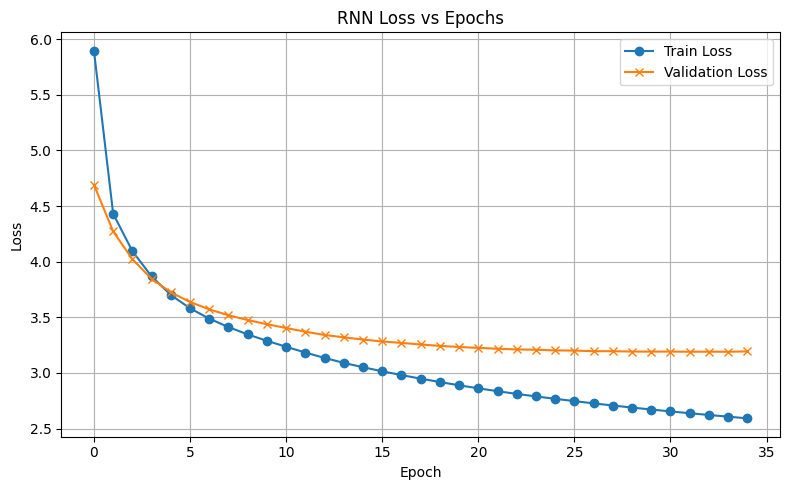

In [521]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.plot(train_losses, label='Train Loss', marker='o')
plt.plot(val_losses, label='Validation Loss', marker='x')
plt.title('RNN Loss vs Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [510]:
import nltk
from nltk.translate.bleu_score import corpus_bleu
nltk.download('punkt')


[nltk_data] Downloading package punkt to C:\Users\Ashwin
[nltk_data]     Kilingar\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [511]:
def generate_caption(model, image_feat, word2idx, idx2word, max_len=20):
    model.eval()
    device = next(model.parameters()).device
    image_feat = image_feat.unsqueeze(0).to(device)  # (1, 4096)

    # Embed image feature and init hidden
    input_emb = model.relu(model.img_fc(image_feat)).unsqueeze(1)  # (1, 1, E)
    h = model.relu(model.init_hidden(image_feat)).unsqueeze(0)     # (1, 1, H)

    caption = []
    input_token = input_emb  # First input is the image embedding

    for _ in range(max_len):
        output, h = model.rnn(input_token, h)        # output: (1, 1, H)
        logits = model.fc_out(output.squeeze(1))     # (1, V)
        predicted_id = torch.argmax(logits, dim=1).item()

        word = idx2word[predicted_id]
        if word == '<end>':
            break
        caption.append(word)

        # Prepare next input: embed the predicted word
        input_token = model.embed(torch.tensor([[predicted_id]]).to(device))  # (1, 1, E)

    return caption


In [512]:
from collections import defaultdict

def load_captions_dict(captions_txt_path):
    captions_dict = defaultdict(list)
    with open(captions_txt_path, 'r') as f:
        for line in f:
            image_tag, caption = line.strip().split('\t')
            image_name = image_tag.split('#')[0]
            captions_dict[image_name].append(caption.strip())
    return captions_dict


In [515]:
from nltk.translate.bleu_score import corpus_bleu
from tqdm import tqdm

def evaluate_bleu(model, dataset, idx2word, captions_dict, word2idx, num_samples=800, max_len=20):
    references = []
    hypotheses = []

    model.eval()
    device = next(model.parameters()).device

    for i in tqdm(range(num_samples), desc="BLEU Evaluation"):
        feature, _, image_name = dataset[i]
        feature = feature.to(device)

        # Get all 5 reference captions for the image
        ref_captions = captions_dict.get(image_name, [])
        ref_tokens = [
            [word.lower() for word in caption.strip().split()]
            for caption in ref_captions if caption.strip()
        ]

        # Generate prediction
        pred_tokens = generate_caption(model, feature, word2idx, idx2word, max_len=max_len)
        pred_tokens = [w.lower() for w in pred_tokens if w not in ['<start>', '<end>', '<pad>']]

        # Only add if both reference and prediction are non-empty
        if len(ref_tokens) > 0 and len(pred_tokens) > 0:
            references.append(ref_tokens)
            hypotheses.append(pred_tokens)

    # If no valid predictions, avoid BLEU calculation
    if len(hypotheses) == 0:
        print("No valid predictions to evaluate BLEU.")
        return

    # Compute BLEU scores
    bleu1 = corpus_bleu(references, hypotheses, weights=(1.0, 0, 0, 0))
    bleu2 = corpus_bleu(references, hypotheses, weights=(0.5, 0.5, 0, 0))
    bleu3 = corpus_bleu(references, hypotheses, weights=(0.33, 0.33, 0.33, 0))
    bleu4 = corpus_bleu(references, hypotheses, weights=(0.25, 0.25, 0.25, 0.25))

    print(f"\nBLEU-1: {bleu1:.4f}")
    print(f"BLEU-2: {bleu2:.4f}")
    print(f"BLEU-3: {bleu3:.4f}")
    print(f"BLEU-4: {bleu4:.4f}")


In [516]:
captions_dict=load_captions_dict("./output/captions.txt")
evaluate_bleu(model, val_ds, idx2word,captions_dict, word2idx, num_samples=4000)


BLEU Evaluation:   0%|          | 0/4000 [00:00<?, ?it/s]

BLEU Evaluation: 100%|██████████| 4000/4000 [00:23<00:00, 168.32it/s]



BLEU-1: 0.4643
BLEU-2: 0.2440
BLEU-3: 0.1286
BLEU-4: 0.0731


In [ ]:
# def generate_and_show_test_examples(model, dataset, idx2word, word2idx, num_examples=5):
#     model.eval()
#     print("\n=== Sample Caption Generation ===")
#     for i in random.sample(range(len(dataset)), num_examples):
#         feature, caption_tensor,_ = dataset[i]
#         feature = feature.to(next(model.parameters()).device)

#         # Generate prediction
#         predicted_caption = generate_caption(model, feature, word2idx, idx2word)
#         predicted_text = ' '.join(predicted_caption)

#         # Ground truth caption (single one from the dataset item)
#         true_ids = caption_tensor.tolist()
#         true_caption = [idx2word[idx] for idx in true_ids if idx not in [word2idx['<pad>'], word2idx['<start>'], word2idx['<end>']]]
#         true_text = ' '.join(true_caption)
        

#         print(f"\nSample {i + 1}")
#         print(f"Predicted:   {predicted_text}")
#         print(f"Ground Truth: {true_text}")


In [ ]:
# generate_and_show_test_examples(model, val_ds, idx2word, word2idx, num_examples=10)

In [517]:
import random
import os
import torch
import matplotlib.pyplot as plt
from PIL import Image
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction

def generate_and_show_test_examples(model, dataset, idx2word, word2idx, num_examples=5, image_dir='./output/images/Images'):
    model.eval()
    smooth = SmoothingFunction().method1
    device = next(model.parameters()).device

    print("\n=== Sample Caption Generation ===")

    for i in random.sample(range(len(dataset)), num_examples):
        feature, caption_tensor, image_name = dataset[i]
        feature = feature.to(device)

        # Generate prediction
        predicted_caption = generate_caption(model, feature, word2idx, idx2word)
        predicted_caption = [w.lower() for w in predicted_caption if w not in ['<start>', '<end>', '<pad>']]
        predicted_text = ' '.join(predicted_caption)

        # Ground truth
        true_ids = caption_tensor.tolist()
        ground_truth = [
            idx2word[idx].lower()
            for idx in true_ids
            if idx not in [word2idx['<pad>'], word2idx['<start>'], word2idx['<end>']]
        ]

        # Compute BLEU scores
        reference = [ground_truth]
        candidate = predicted_caption

        bleu1 = sentence_bleu(reference, candidate, weights=(1, 0, 0, 0), smoothing_function=smooth)
        bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)
        bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.33, 0), smoothing_function=smooth)
        bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)

        # Load and display image
        image_path = os.path.join(image_dir, image_name)
        image = Image.open(image_path).convert("RGB")

        # Plot with captions and BLEU scores
        plt.figure(figsize=(8, 5))
        plt.imshow(image)
        plt.axis('off')
        plt.title(
            f"Pred: {predicted_text}\n"
            f"GT: {' '.join(ground_truth)}\n"
            f"BLEU-1: {bleu1:.2f}, BLEU-2: {bleu2:.2f}, BLEU-3: {bleu3:.2f}, BLEU-4: {bleu4:.2f}",
            fontsize=9
        )
        plt.tight_layout()
        plt.show()



=== Sample Caption Generation ===


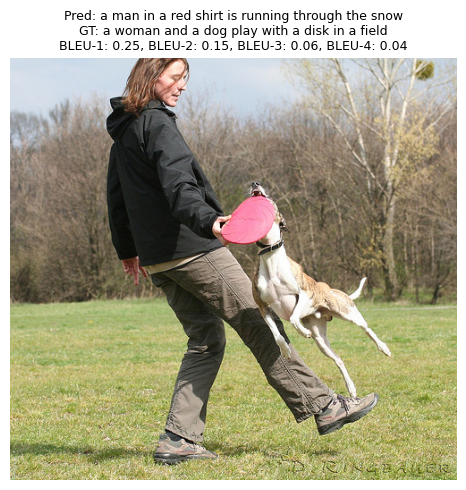

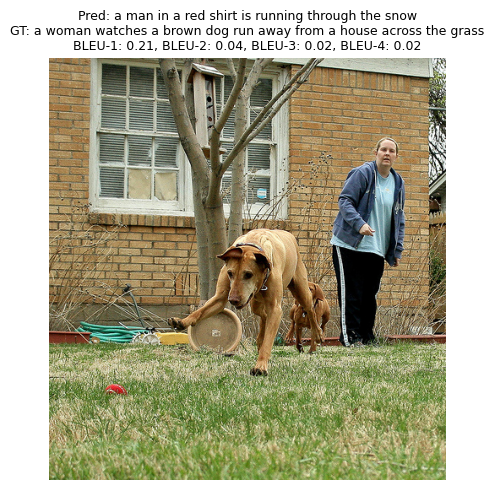

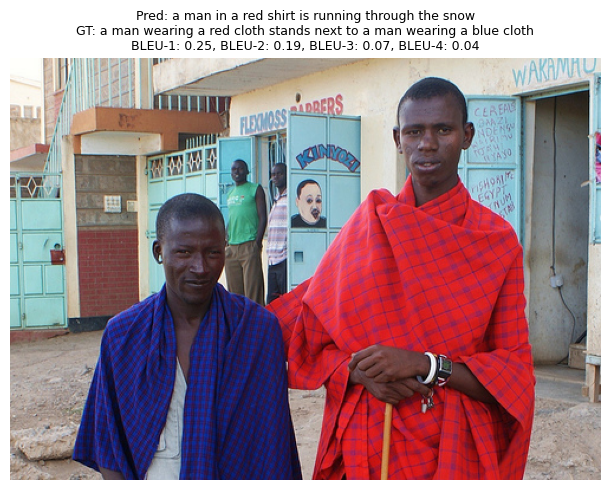

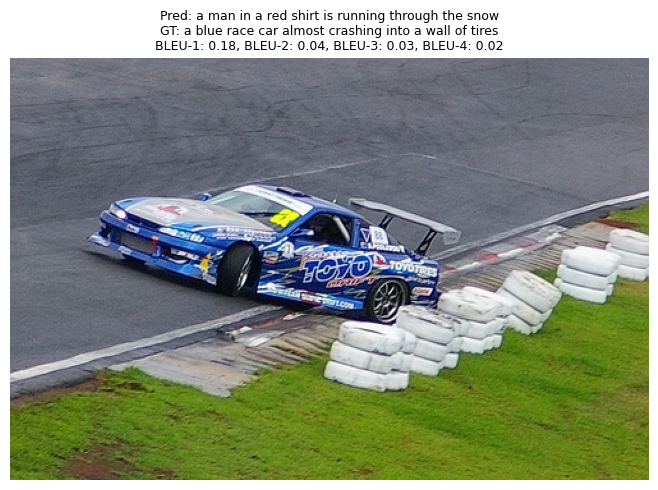

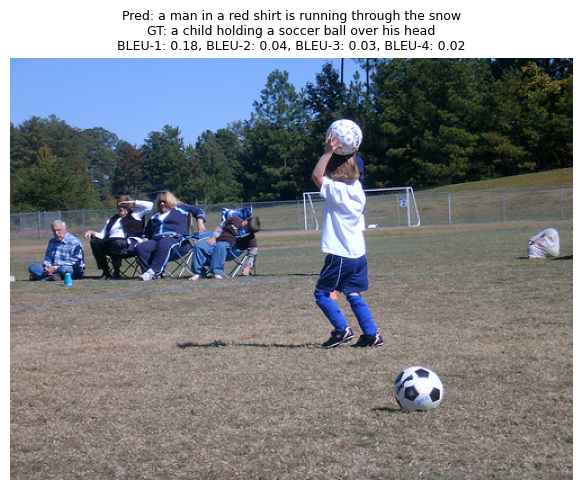

...

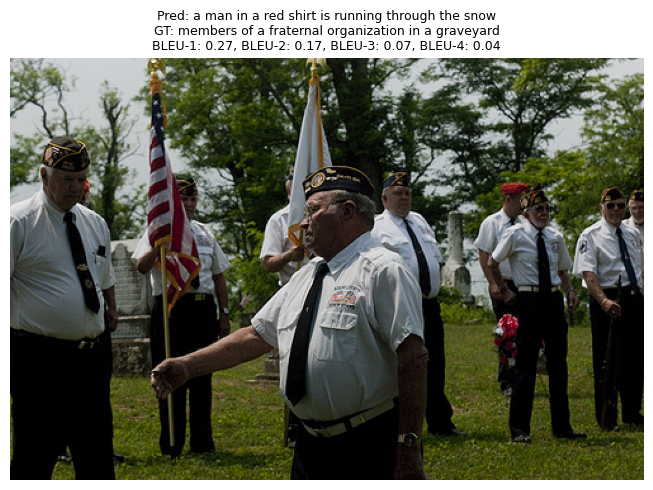

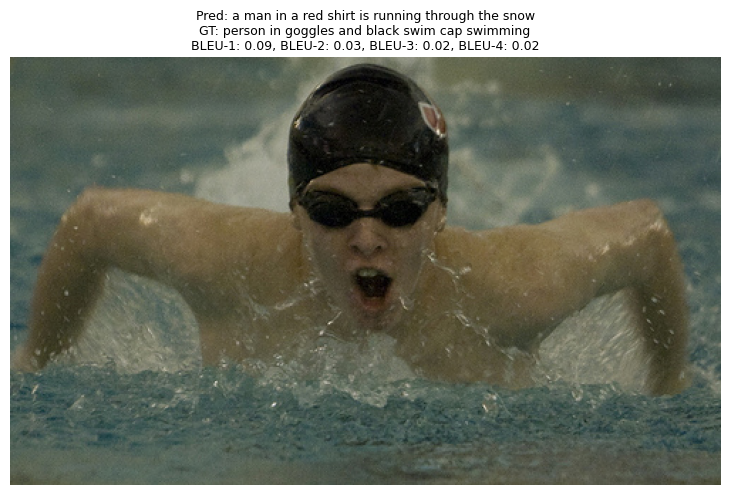

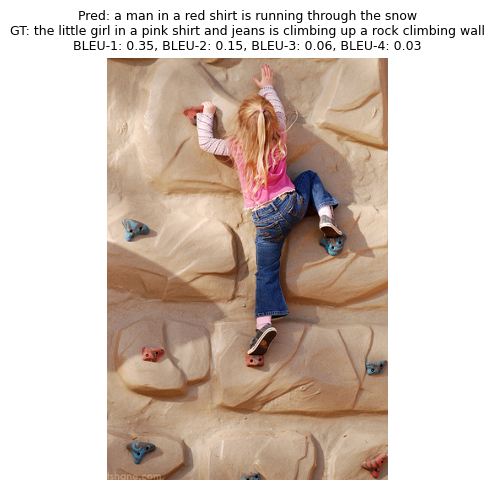

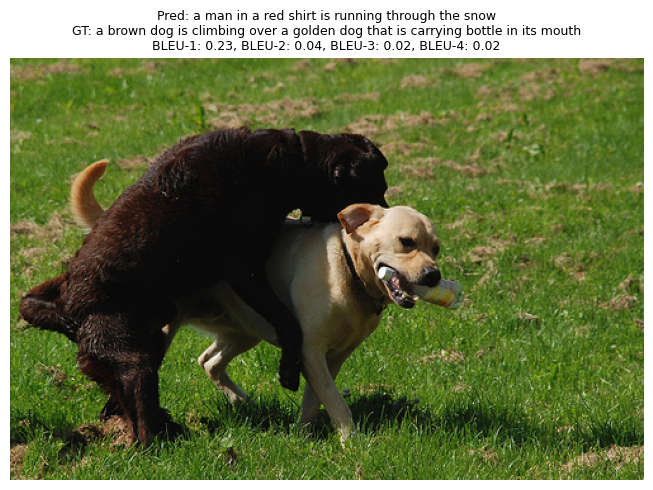

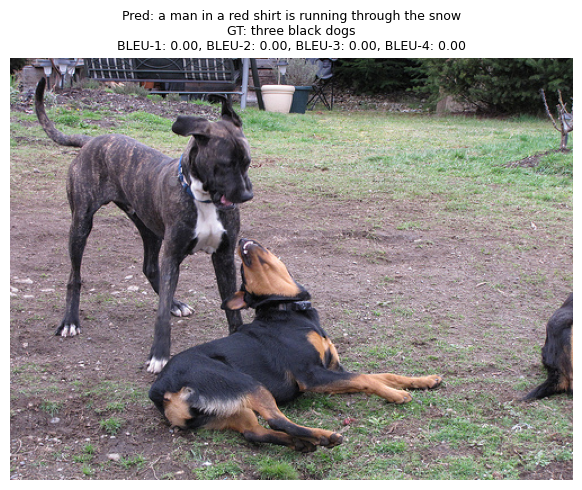

In [519]:
generate_and_show_test_examples(model, val_ds, idx2word, word2idx, num_examples=20)